In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
# Suppress all warnings
warnings.filterwarnings('ignore')

In [2]:
# Load the data
file_path = 'Kaggle_Sirio_Libanes_ICU_Prediction.xlsx'  # Update with the correct file path
df = pd.read_excel(file_path)


# EDA

In [3]:
df.head()


,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,...,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,WINDOW,ICU
0,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0-2,0
1,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,2-4,0
2,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4-6,0
3,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,NaN,NaN,NaN,NaN,-1.000000,-1.000000,6-12,0
4,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-0.238095,-0.818182,-0.389967,0.407558,-0.230462,0.096774,-0.242282,-0.814433,ABOVE_12,1


In [4]:
# Basic info about the dataset
print("\nDataset Info:")
print(df.info())

# Summary statistics
print("\nSummary statistics:")
print(df.describe())

# Check for missing values
print("\nMissing values in each column:")
print(df.isnull().sum())


Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1925 entries, 0 to 1924
Columns: 231 entries, PATIENT_VISIT_IDENTIFIER to ICU
dtypes: float64(225), int64(4), object(2)
memory usage: 3.4+ MB
None

Summary statistics:
       PATIENT_VISIT_IDENTIFIER  AGE_ABOVE65       GENDER  DISEASE GROUPING 1  \
count               1925.000000  1925.000000  1925.000000         1920.000000   
mean                 192.000000     0.467532     0.368831            0.108333   
std                  111.168431     0.499074     0.482613            0.310882   
min                    0.000000     0.000000     0.000000            0.000000   
25%                   96.000000     0.000000     0.000000            0.000000   
50%                  192.000000     0.000000     0.000000            0.000000   
75%                  288.000000     1.000000     1.000000            0.000000   
max                  384.000000     1.000000     1.000000            1.000000   

       DISEASE GROUPING 2  DISEASE GR

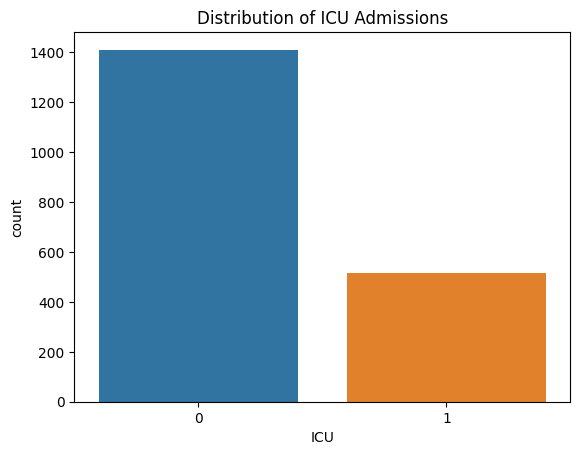

In [6]:
# Distribution of the target variable (assuming 'ICU' is the target)
sns.countplot(x='ICU', data=df)
plt.title('Distribution of ICU Admissions')
plt.show()



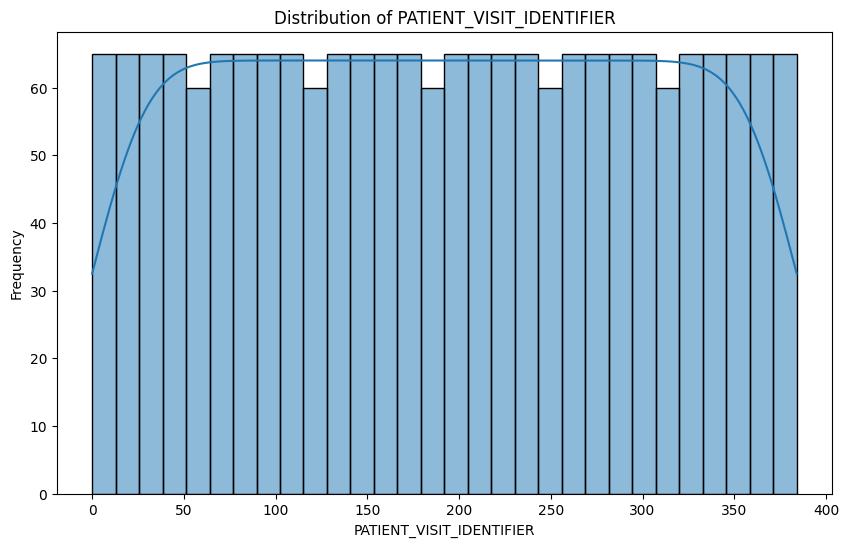

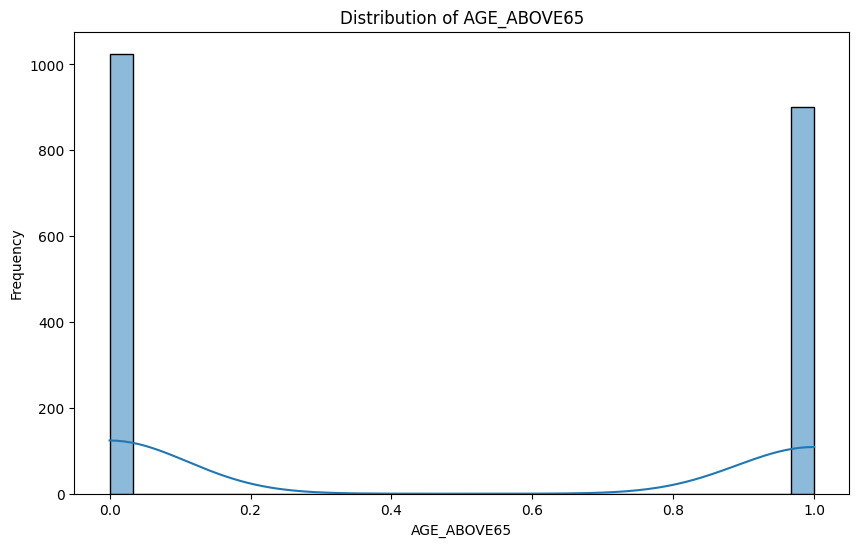

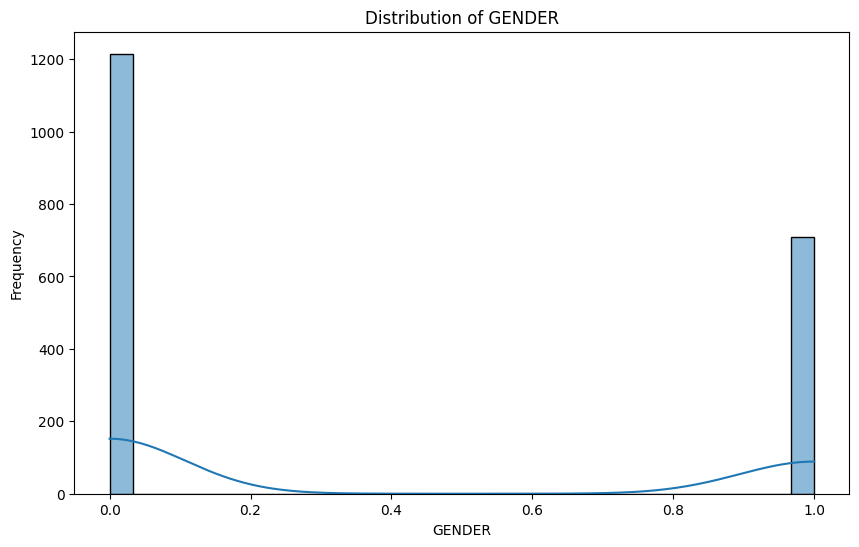

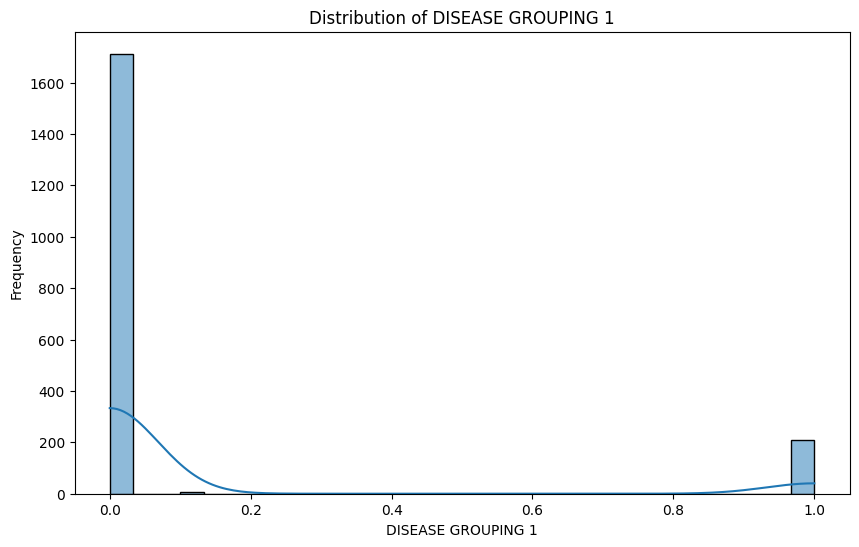

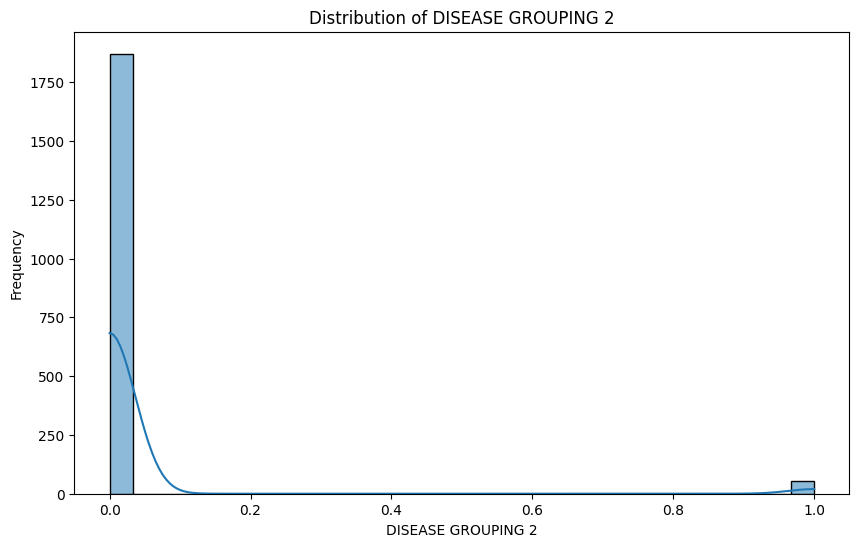

...

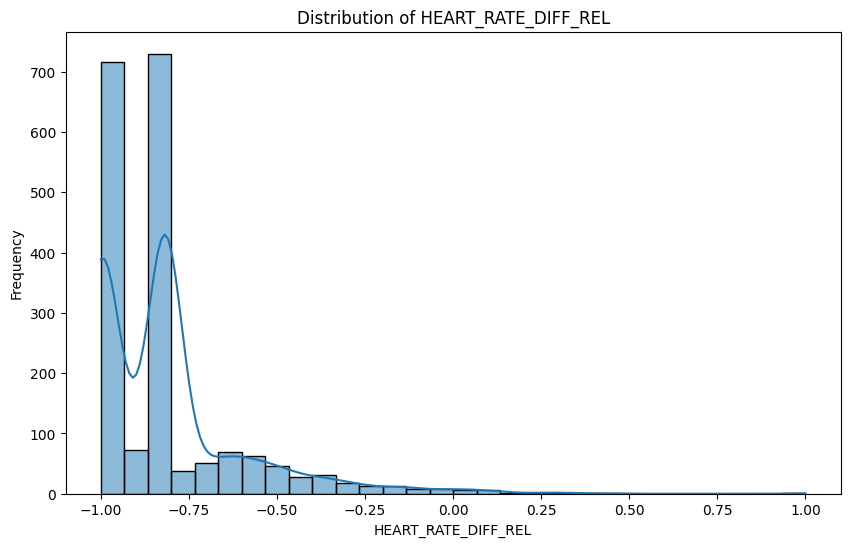

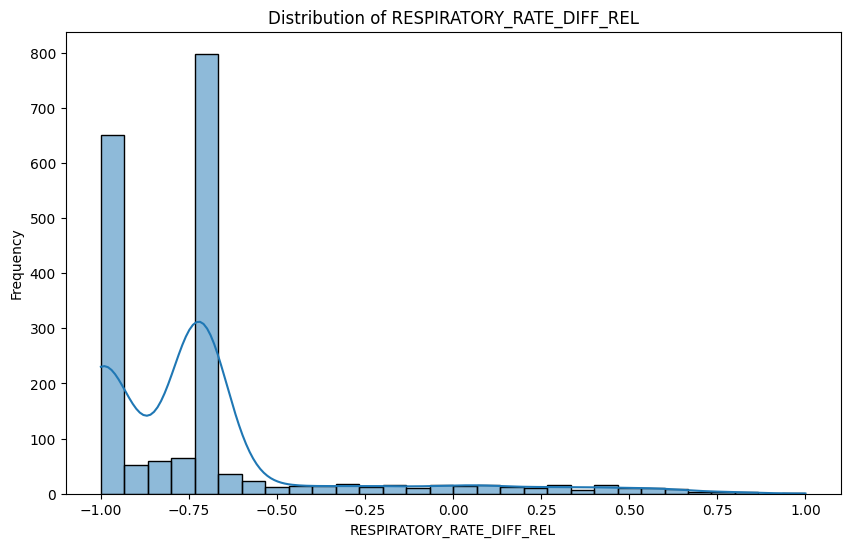

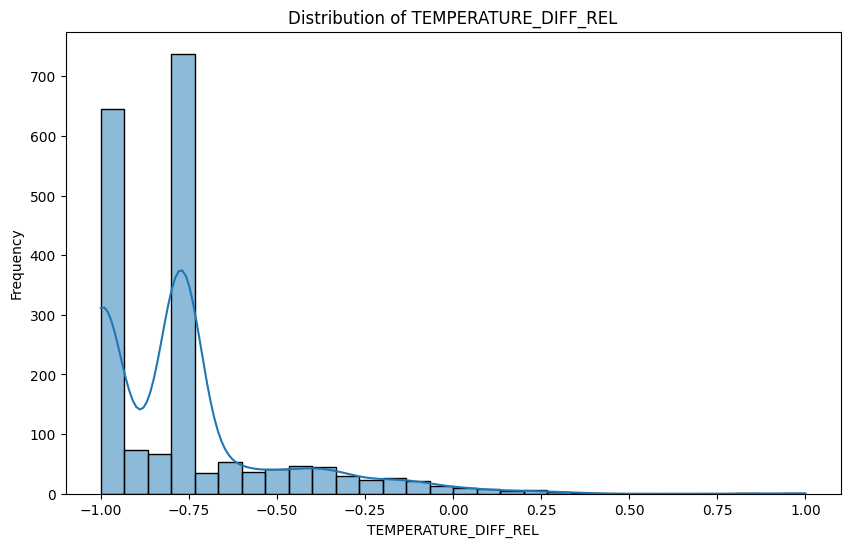

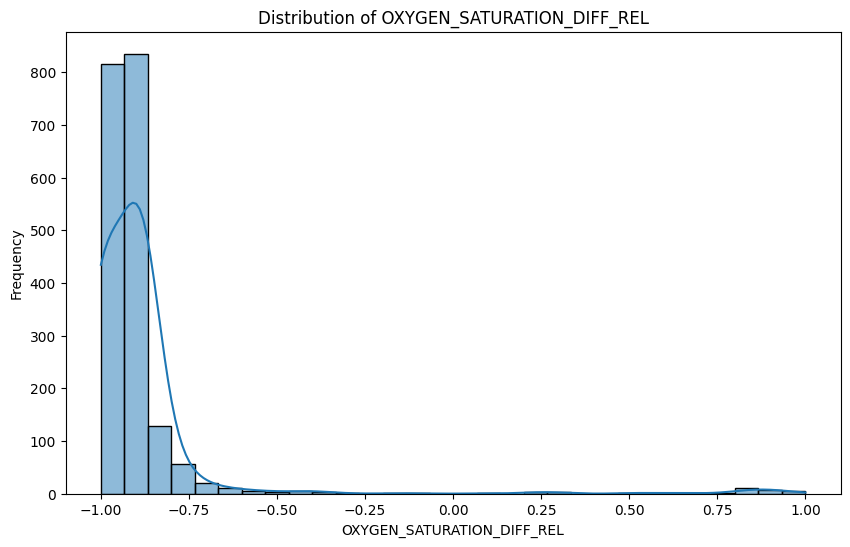

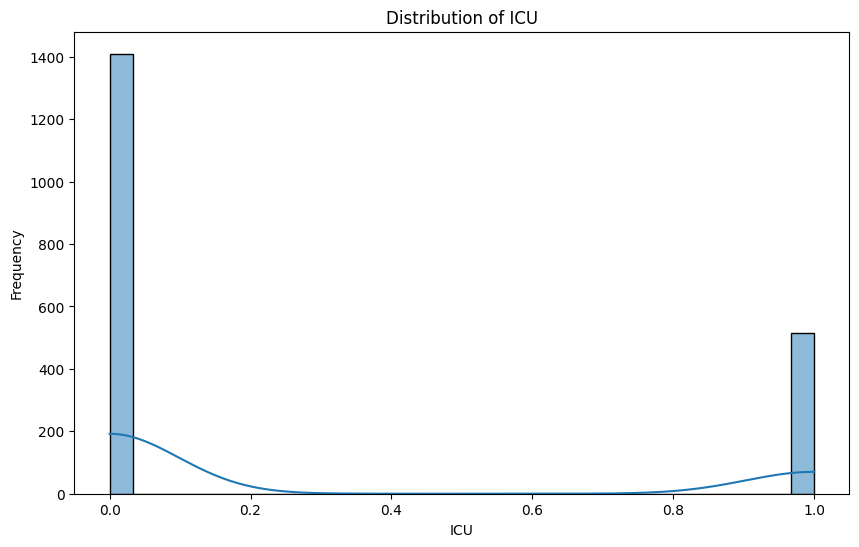

In [11]:


# Plot distribution of each numeric feature
for col in numeric_cols:
    plt.figure(figsize=(10, 6))
    sns.histplot(df[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()


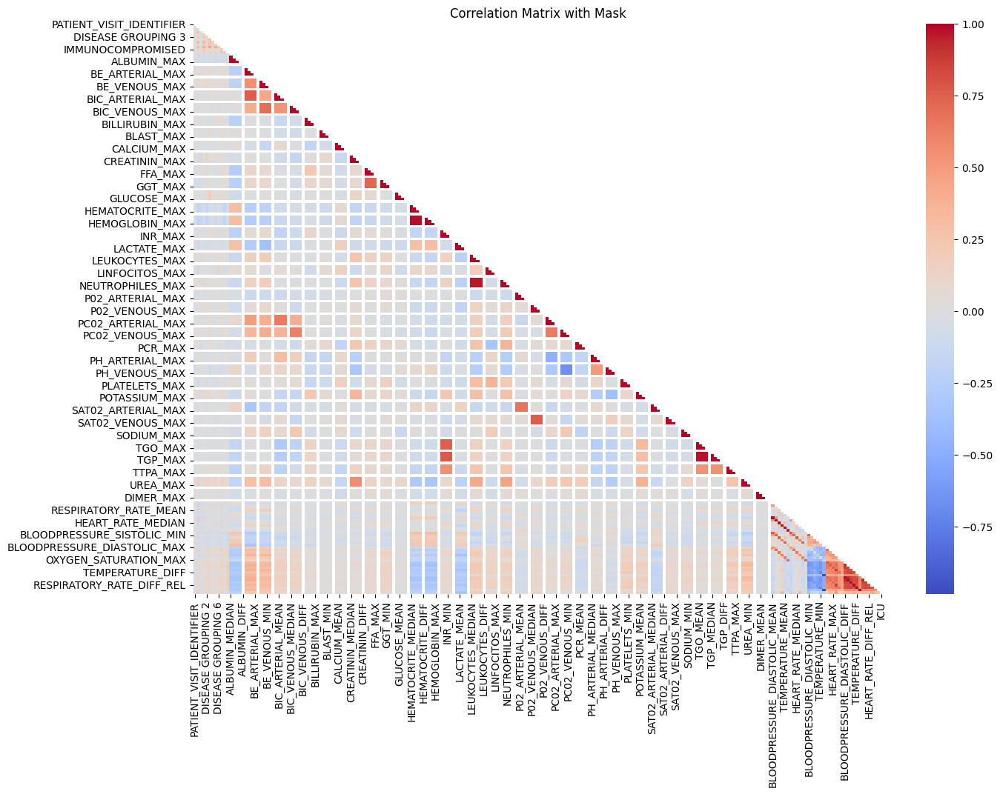

In [12]:
# Correlation matrix with a mask to hide upper triangle
plt.figure(figsize=(15, 10))
mask = np.triu(np.ones_like(df[numeric_cols].corr(), dtype=bool))
sns.heatmap(df[numeric_cols].corr(), mask=mask, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix with Mask')
plt.show()


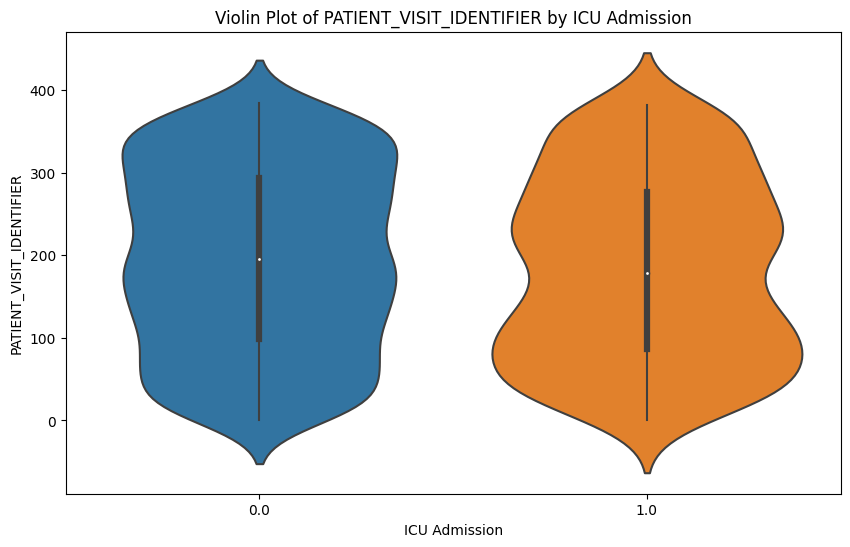

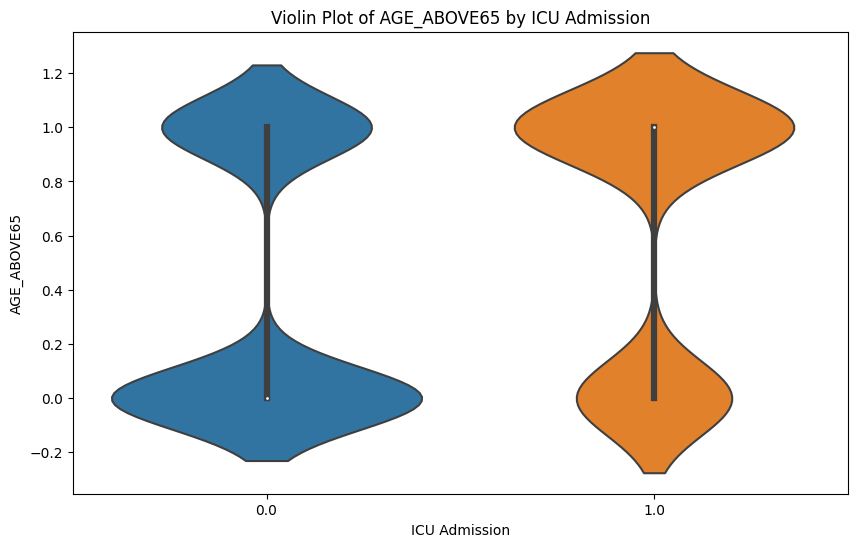

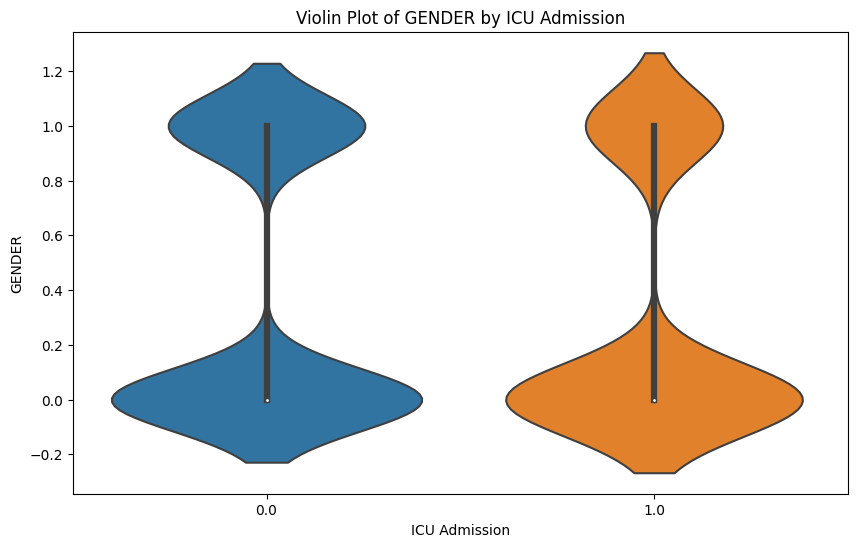

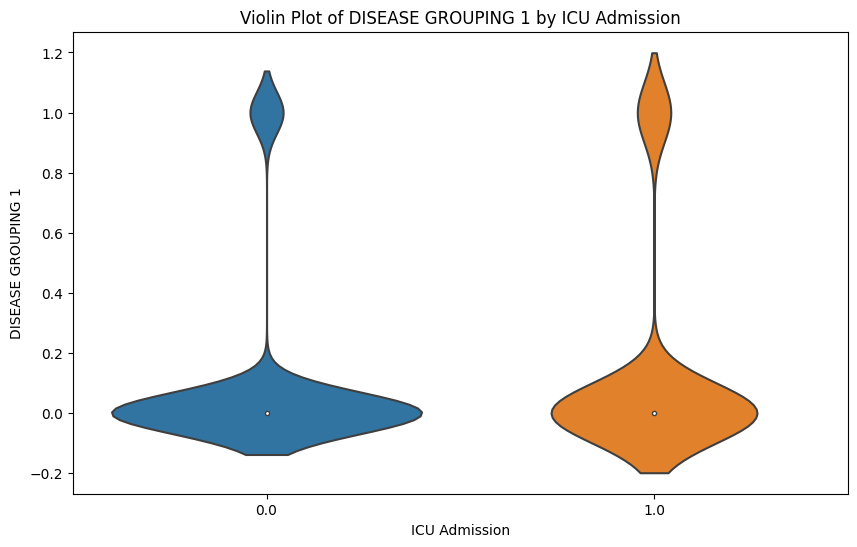

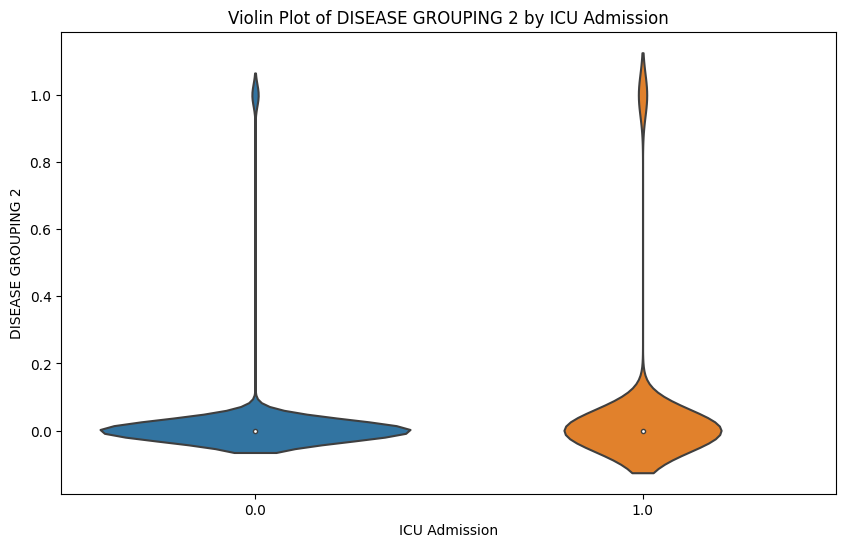

...

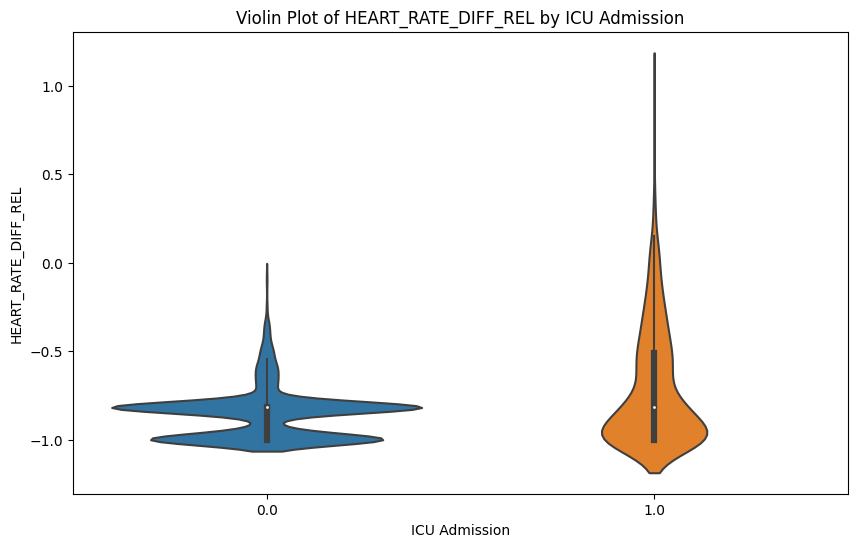

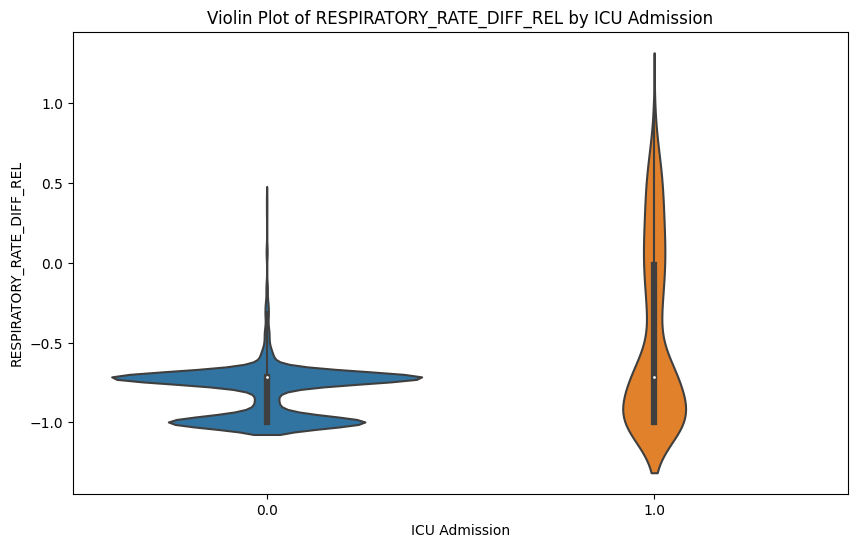

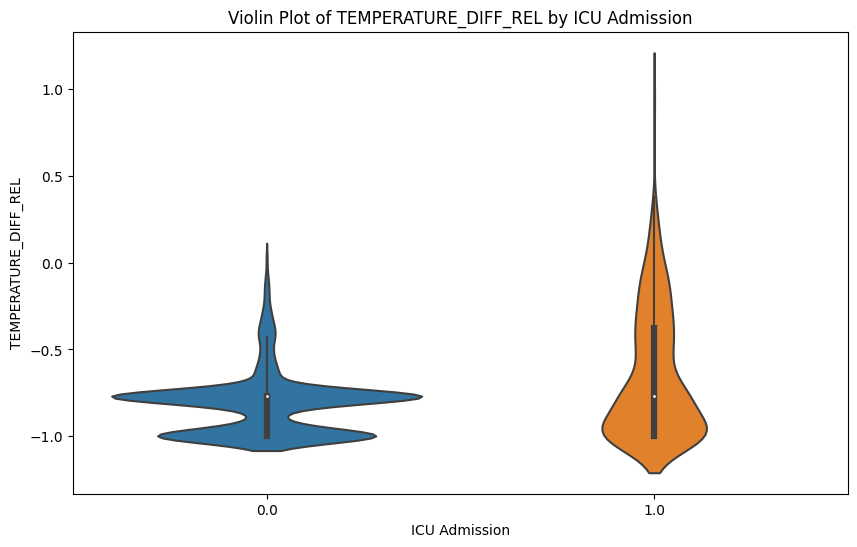

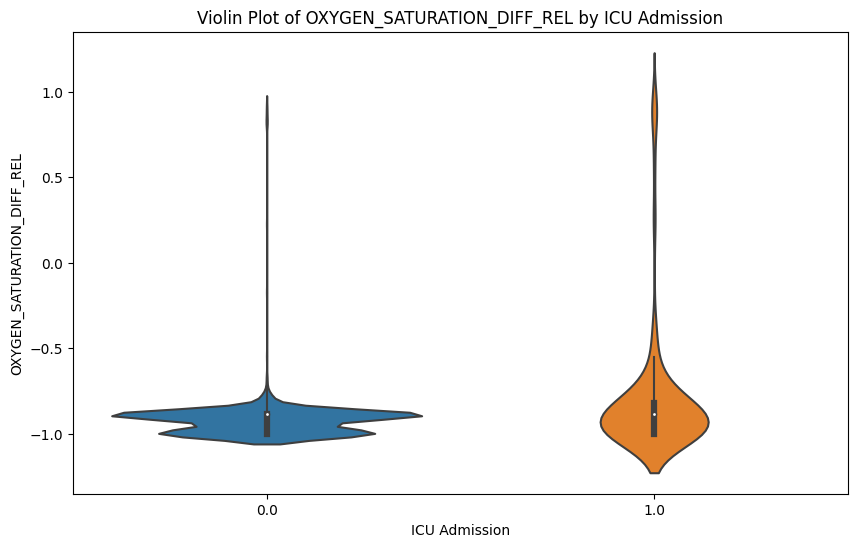

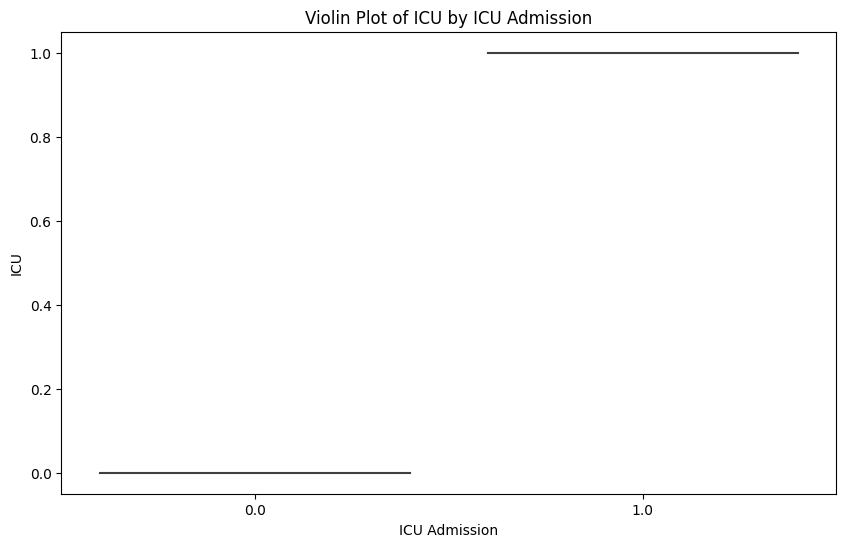

In [13]:
# Violin plots for numeric features against the target variable 'ICU'
for col in numeric_cols:
    plt.figure(figsize=(10, 6))
    sns.violinplot(x='ICU', y=col, data=df)
    plt.title(f'Violin Plot of {col} by ICU Admission')
    plt.xlabel('ICU Admission')
    plt.ylabel(col)
    plt.show()


# ML Modelling

In [9]:
# Separate numeric and categorical columns
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns

# Handle missing values for numeric columns
imputer_numeric = SimpleImputer(strategy='mean')
df[numeric_cols] = imputer_numeric.fit_transform(df[numeric_cols])

# Handle missing values for categorical columns
imputer_categorical = SimpleImputer(strategy='most_frequent')
df[categorical_cols] = imputer_categorical.fit_transform(df[categorical_cols])

# Encode categorical variables
label_encoder = LabelEncoder()
for col in categorical_cols:
    df[col] = label_encoder.fit_transform(df[col])

# Feature scaling
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df.drop('ICU', axis=1))
X = pd.DataFrame(scaled_features, columns=df.columns[:-1])
y = df['ICU']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model Development
# Candidate models: Random Forest and Gradient Boosting
models = {
    'RandomForest': RandomForestClassifier(random_state=42),
    'GradientBoosting': GradientBoostingClassifier(random_state=42)
}

# Grid search for hyperparameter tuning 
param_grid_rf = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20],
    'min_samples_split': [2, 5]
}
grid_search_rf = GridSearchCV(models['RandomForest'], param_grid_rf, cv=5, scoring='roc_auc')
grid_search_rf.fit(X_train, y_train)

# Best model
best_rf = grid_search_rf.best_estimator_
print(f"Best Random Forest Model: {best_rf}")

# Cross-validation scores for Random Forest
cv_scores_rf = cross_val_score(best_rf, X_train, y_train, cv=5, scoring='roc_auc')
print(f"Cross-validated AUC for Random Forest: {cv_scores_rf.mean()}")

# Train and evaluate the model
best_rf.fit(X_train, y_train)
y_pred = best_rf.predict(X_test)


Best Random Forest Model: RandomForestClassifier(max_depth=20, n_estimators=200, random_state=42)
Cross-validated AUC for Random Forest: 0.9159943115009923



Accuracy Score: 0.8493506493506493

Confusion Matrix:
 [[262  16]
 [ 42  65]]

Classification Report:
               precision    recall  f1-score   support

         0.0       0.86      0.94      0.90       278
         1.0       0.80      0.61      0.69       107

    accuracy                           0.85       385
   macro avg       0.83      0.77      0.80       385
weighted avg       0.85      0.85      0.84       385


ROC-AUC Score: 0.7749613393397432


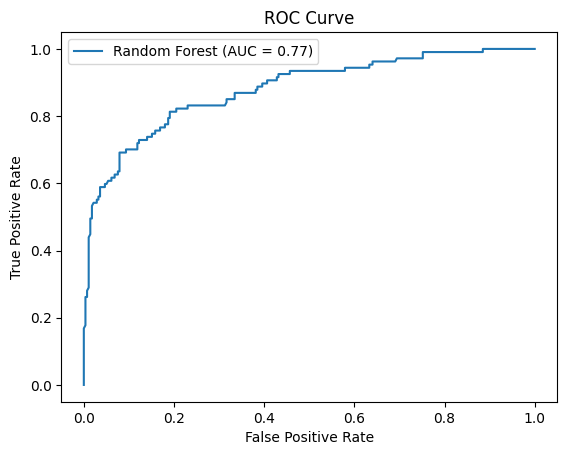

In [10]:

# Model Evaluation
print("\nAccuracy Score:", accuracy_score(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# ROC-AUC Score
roc_auc = roc_auc_score(y_test, y_pred)
print("\nROC-AUC Score:", roc_auc)

# Plot ROC Curve
from sklearn.metrics import roc_curve

fpr, tpr, _ = roc_curve(y_test, best_rf.predict_proba(X_test)[:, 1])
plt.figure()
plt.plot(fpr, tpr, label=f"Random Forest (AUC = {roc_auc:.2f})")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='best')
plt.show()